# Assignment 2

In this assignment you will create a coordinate-based multilayer perceptron in numpy from scratch. For each input image coordinate $(x,y)$, the model predicts the associated color $(r,g,b)$.

![Network diagram](https://user-images.githubusercontent.com/3310961/85066930-ad444580-b164-11ea-9cc0-17494679e71f.png)

You will then compare the following input feature mappings $\gamma (\mathbf{v})$.

- No mapping: $\gamma(\mathbf{v})= \mathbf{v}$. 

- Basic mapping: $\gamma(\mathbf{v})=\left[ \cos(2 \pi \mathbf{v}),\sin(2 \pi \mathbf{v}) \right]^\mathrm{T}$. 

- Gaussian Fourier feature mapping: $\gamma(\mathbf{v})= \left[ \cos(2 \pi \mathbf B \mathbf{v}), \sin(2 \pi \mathbf B \mathbf{v}) \right]^\mathrm{T}$, 
where each entry in $\mathbf B \in \mathbb R^{m \times d}$ is sampled from $\mathcal N(0,\sigma^2)$.

Some notes to help you with that:

- You will implement the mappings in the helper functions `get_B_dict` and `input_mapping`. 
- The basic mapping can be considered a case where $\mathbf B \in \mathbb R^{2 \times 2}$ is the indentity matrix. 
- For this assignment, $d$ is 2 because the input coordinates in two dimensions. 
- You can experiment with $m$, like $m=256$.
- You should show results for $\sigma$ value of 1.

Source: https://bmild.github.io/fourfeat/ 
This assignment is inspired by and built off of the authors' demo. 

## Setup

### (Optional) Colab Setup
If you aren't using Colab, you can delete the following code cell. Replace the path below with the path in your Google Drive to the uploaded assignment folder. Mounting to Google Drive will allow you access the other .py files in the assignment folder and save outputs to this folder

In [31]:
# you will be prompted with a window asking to grant permissions
# click connect to google drive, choose your account, and click allow
from google.colab import drive
drive.mount("/content/drive")

ModuleNotFoundError: No module named 'google'

In [ ]:
# TODO: fill in the path in your Google Drive in the string below
# Note: do not escape slashes or spaces in the path string
import os
datadir = "/content/assignment2"
if not os.path.exists(datadir):
  !ln -s "/content/drive/My Drive/path/to/your/assignment2/" $datadir
os.chdir(datadir)
!pwd

### Imports

In [1]:
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os, imageio
import cv2
import numpy as np

# imports /content/assignment2/models/neural_net.py if you mounted correctly 
from models.neural_net import NeuralNetwork

# makes sure your NeuralNetwork updates as you make changes to the .py file
%load_ext autoreload
%autoreload 2

# sets default size of plots
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0)  

## Helper Functions

### Image Data and Feature Mappings (Fill in TODOs)

In [2]:
# Data loader - already done for you
def get_image(size=512, \
              image_url='https://bmild.github.io/fourfeat/img/lion_orig.png'):

  # Download image, take a square crop from the center  
  img = imageio.imread(image_url)[..., :3] / 255.
  c = [img.shape[0]//2, img.shape[1]//2]
  r = 256
  img = img[c[0]-r:c[0]+r, c[1]-r:c[1]+r]

  if size != 512:
    img = cv2.resize(img, (size, size))

  plt.imshow(img)
  plt.show()

  # Create input pixel coordinates in the unit square
  coords = np.linspace(0, 1, img.shape[0], endpoint=False)
  x_test = np.stack(np.meshgrid(coords, coords), -1)
  test_data = [x_test, img]
  train_data = [x_test[::2, ::2], img[::2, ::2]]

  return train_data, test_data

In [9]:
# Create the mappings dictionary of matrix B -  you will implement this
def get_B_dict(size): 
  mapping_size = size // 2 # you may tweak this hyperparameter
  B_dict = {}
  B_dict['none'] = None
  
  # add B matrix for basic, gauss_1.0
  # TODO implement this
  B_dict['basic'] = np.eye(2)
  # B_dict['gauss_X'] = np.random.normal(0,1,size=(mapping_size,2))
  B_dict['gauss_X'] = np.random.normal(0,1,size=(mapping_size,2))
  return B_dict

In [3]:
# Given tensor x of input coordinates, map it using B - you will implement
def input_mapping(x, B):
  if B is None:
    # "none" mapping - just returns the original input coordinates
    return x
  else:
    # "basic" mapping and "gauss_X" mappings project input features using B
    # TODO implement this
    t = 2*np.pi*x@B.T
    S = np.sin(t)
    C = np.cos(t)
    return np.hstack((C,S))
    # return np.array([np.vstack((C[:,i],S[:,i])).flatten(order='F') for i in range(len(x))])

### MSE Loss and PSNR Error (Fill in TODOs)

In [4]:
def mse(y, p):
  # TODO implement this
  # make sure it is consistent with your implementation in neural_net.py
  return np.mean((y-p)**2)

def psnr(y, p):
  return -10 * np.log10(2.*mse(y, p))

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_9404/2979632171.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


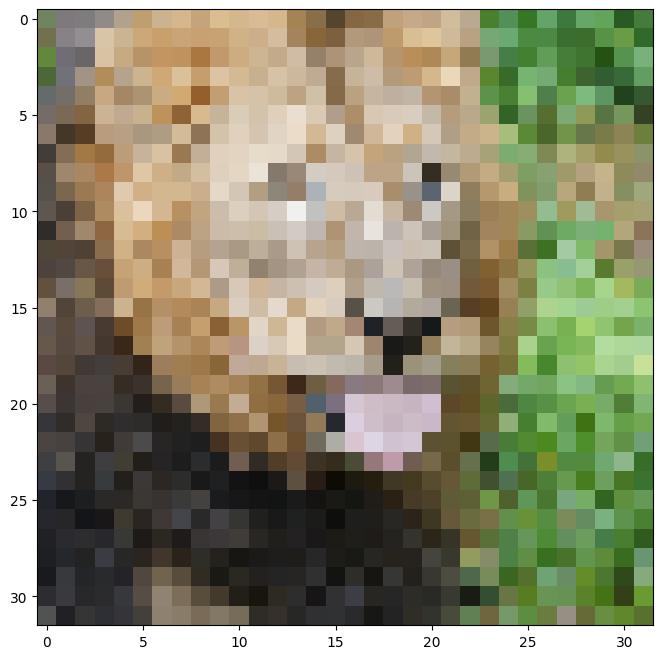

In [5]:
size = 32
train_data, test_data = get_image(size)

Some suggested hyperparameter choices to help you start
- hidden layer count: 4
- hidden layer size: 256
- number of epochs: 1000
- learning rate: 0.1


In [10]:
num_layers = 4  # you should not change this value

# TODO: Set the hyperparameters
hidden_size = 256
epochs = 300
learning_rate = 60
output_size = 3
B_dict = get_B_dict(64)
# 100, 64 for 300 epochs
print('B_dict items:')
for k,v in B_dict.items():
    print('\t',k,np.array(v).shape)

B_dict items:
	 none ()
	 basic (2, 2)
	 gauss_X (32, 2)


In [6]:
# Apply the input feature mapping to the train and test data - already done for you
def get_input_features(B_dict, mapping):
  # mapping is the key to the B_dict, which has the value of B
  # B is then used with the function `input_mapping` to map x  
  y_train = train_data[1].reshape(-1, output_size)
  y_test = test_data[1].reshape(-1, output_size)
  X_train = input_mapping(train_data[0].reshape(-1, 2), B_dict[mapping])
  X_test = input_mapping(test_data[0].reshape(-1, 2), B_dict[mapping])
  return X_train, y_train, X_test, y_test

### Plotting and video helper functions (you don't need to change anything here)

In [11]:
def plot_training_curves(train_loss, train_psnr, test_psnr):
  # plot the training loss
  plt.subplot(2, 1, 1)
  plt.plot(train_loss)
  plt.title('MSE history')
  plt.xlabel('Iteration')
  plt.ylabel('MSE Loss')

  # plot the training and testing psnr
  plt.subplot(2, 1, 2)
  plt.plot(train_psnr, label='train')
  plt.plot(test_psnr, label='test')
  plt.title('PSNR history')
  plt.xlabel('Iteration')
  plt.ylabel('PSNR')
  plt.legend()

  plt.tight_layout()
  plt.show()

def plot_reconstruction(p, y):
  p_im = p.reshape(size,size,3)
  y_im = y.reshape(size,size,3)

  plt.figure(figsize=(12,6))

  # plot the reconstruction of the image
  plt.subplot(1,2,1), plt.imshow(p_im), plt.title("reconstruction")

  # plot the ground truth image
  plt.subplot(1,2,2), plt.imshow(y_im), plt.title("ground truth")

  print("Final Test MSE", mse(y, p))
  print("Final Test psnr",psnr(y, p))

def plot_reconstruction_progress(predicted_images, y, N=8):
  total = len(predicted_images)
  step = total // N
  plt.figure(figsize=(24, 4))

  # plot the progress of reconstructions
  for i, j in enumerate(range(0,total, step)):
      plt.subplot(1, N+1, i+1)
      plt.imshow(predicted_images[j].reshape(size,size,3))
      plt.axis("off")
      plt.title(f"iter {j}")

  # plot ground truth image
  plt.subplot(1, N+1, N+1)
  plt.imshow(y.reshape(size,size,3))
  plt.title('GT')
  plt.axis("off")
  plt.show()

def plot_feature_mapping_comparison(outputs, gt):
  # plot reconstruction images for each mapping
  plt.figure(figsize=(24, 4))
  N = len(outputs)
  for i, k in enumerate(outputs):
      plt.subplot(1, N+1, i+1)
      plt.imshow(outputs[k]['pred_imgs'][-1].reshape(size, size, -1))
      plt.title(k)
  plt.subplot(1, N+1, N+1)
  plt.imshow(gt)
  plt.title('GT')
  plt.show()

  # plot train/test error curves for each mapping
  iters = len(outputs[k]['train_psnrs'])
  plt.figure(figsize=(16, 6))
  plt.subplot(121)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['train_psnrs'], label=k)
  plt.title('Train error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.subplot(122)
  for i, k in enumerate(outputs):
      plt.plot(range(iters), outputs[k]['test_psnrs'], label=k)
  plt.title('Test error')
  plt.ylabel('PSNR')
  plt.xlabel('Training iter')
  plt.legend()
  plt.show()

# Save out video
def create_and_visualize_video(outputs, size=size, epochs=epochs, filename='training_convergence.mp4'):
  all_preds = np.concatenate([outputs[n]['pred_imgs'].reshape(epochs,size,size,3)[::25] for n in outputs], axis=-2)
  data8 = (255*np.clip(all_preds, 0, 1)).astype(np.uint8)
  f = os.path.join(filename)
  imageio.mimwrite(f, data8, fps=20)

  # Display video inline
  from IPython.display import HTML
  from base64 import b64encode
  mp4 = open(f, 'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

  N = len(outputs)
  if N == 1:
    return HTML(f'''
    <video width=256 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    ''')
  else:
    return HTML(f'''
    <video width=1000 controls autoplay loop>
          <source src="{data_url}" type="video/mp4">
    </video>
    <table width="1000" cellspacing="0" cellpadding="0">
      <tr>{''.join(N*[f'<td width="{1000//len(outputs)}"></td>'])}</tr>
      <tr>{''.join(N*['<td style="text-align:center">{}</td>'])}</tr>
    </table>
    '''.format(*list(outputs.keys())))

### Experiment Runner (Fill in TODOs)

In [285]:
def NN_experiment(X_train, y_train, X_test, y_test, input_size, num_layers,\
                  hidden_size, output_size, epochs,\
                  learning_rate, opt='SGD',regularization = 0):
    
    # Initialize a new neural network model
    hidden_sizes = [hidden_size] * (num_layers - 1)
    net = NeuralNetwork(input_size, hidden_sizes, output_size, num_layers, opt)

    # Variables to store performance for each epoch
    train_loss = np.zeros(epochs)
    train_psnr = np.zeros(epochs)
    test_psnr = np.zeros(epochs)
    predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))
    N = len(X_train)
    batch_size = 32
    T = 0

    # For each epoch...
    for epoch in tqdm(range(epochs)):
    
        # Shuffle the dataset
        # TODO implement this
        shuffled_i = np.random.permutation(N)
        X_train = X_train[shuffled_i]
        y_train = y_train[shuffled_i]
        
        for i in range(0,N,batch_size) :

            T += 1
            di = min(batch_size, N-i)
            X = X_train[i:i+di]
            y = y_train[i:i+di]

            # Training
            # Run the forward pass of the model to get a prediction and record the psnr
            # TODO implement this
            p = net.forward(X)

            # Run the backward pass of the model to compute the loss, record the loss, and update the weights
            # TODO implement this
            train_loss[epoch] = net.backward(y)
            net.update(lr=learning_rate,t=T,R = regularization)

        # Testing
        # No need to run the backward pass here, just run the forward pass to compute and record the psnr
        # TODO implement this
        predicted_images[epoch] = net.forward(X_test)
        train_psnr[epoch] = psnr(y_train,net.forward(X_train))
        test_psnr[epoch] = psnr(y_test,predicted_images[epoch])
        if opt == "SGD" :
            learning_rate *= 0.975

    return net, train_psnr, test_psnr, train_loss, predicted_images

# Low Resolution Reconstruction

#### Low Resolution Reconstruction - SGD - None Mapping

  0%|          | 0/300 [00:00<?, ?it/s]

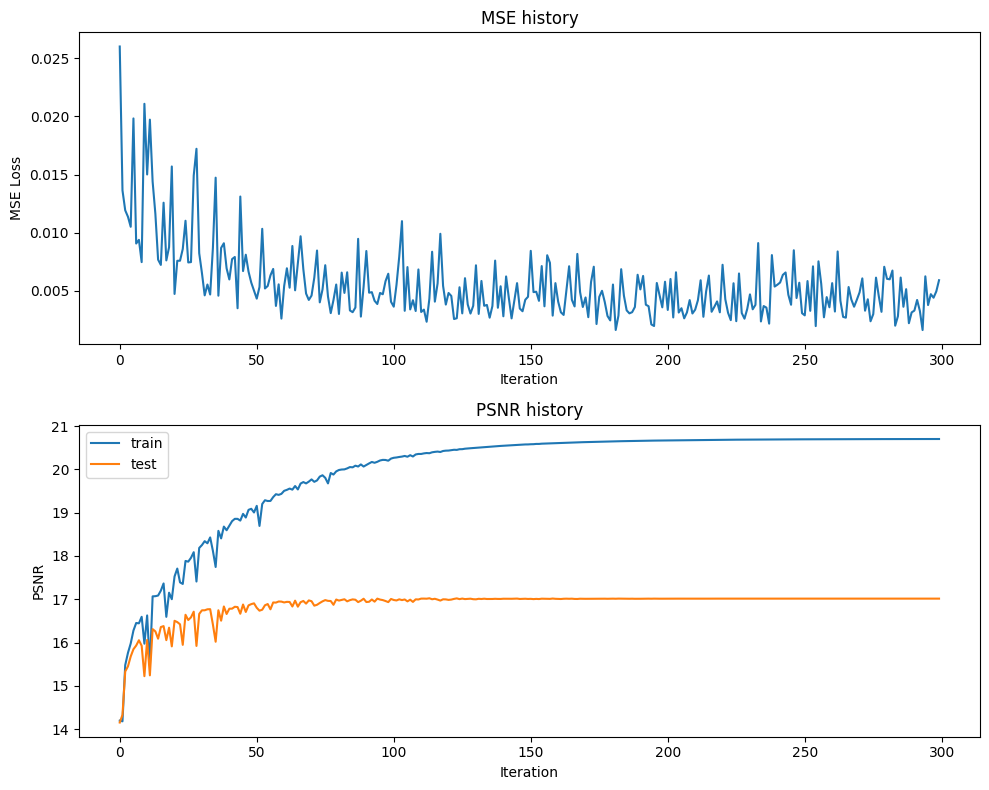

Final Test MSE 0.00994194616470949
Final Test psnr 17.014985972160904


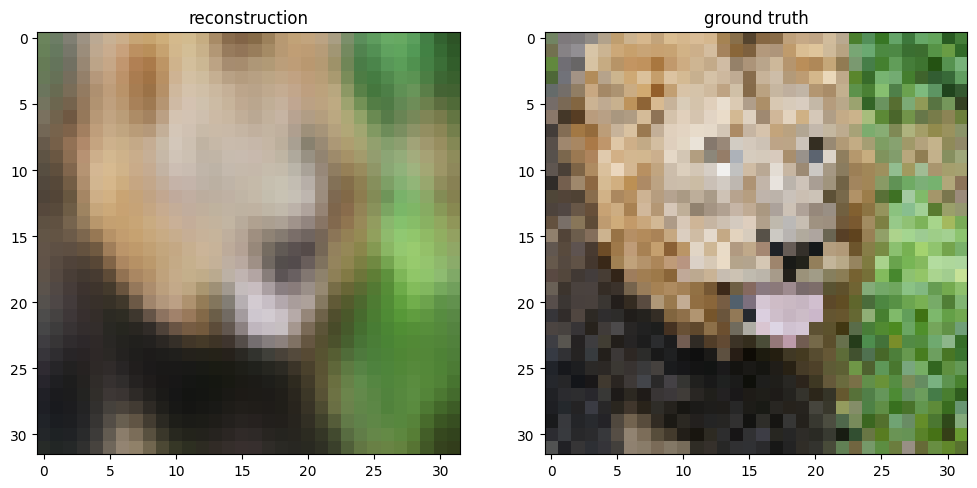

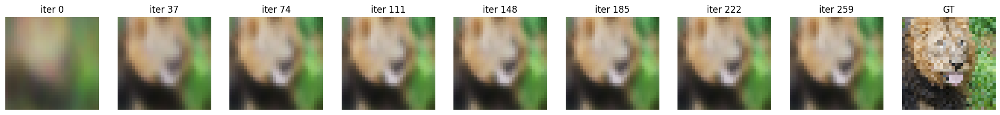

In [168]:
# Increasing learning rate gives better test and train psnr but there are some instabilities during the training process initially which dies down
# This instability does not occur with a lower learning rate like 5
# Since the kind of process likes a high learning rate to capture the information in the image, it doesn't benefit much from a learning rate decay operation
# Also more the frequencies available in the feature mapping operation for gaussain fourier functions, the higher psnr but at the cost of increased computation time
# The mini batch mode is the most helful in the tuning process, as it gave a much better performance as compared to updating at every sample and full batch mode
# Full batch mode gave smoother transitions in mse while single sample udpate was very chaotic and the plot didn't seem to be converging to a lower mse with epochs

# get input features 
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
X_train, y_train, X_test, y_test = get_input_features(B_dict,"gauss_X")

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, X_train.shape[1], num_layers, hidden_size, output_size, epochs, learning_rate)
# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Low Resolution Reconstruction - SGD - Various Input Mapping Stategies

In [286]:
def train_wrapper(mapping, B_dict, num_layers, hidden_size, output_size, epochs,  learning_rate, opt='SGD',regularization=0):
    # TODO implement me
    # makes it easy to run all your mapping experiments in a for loop
    # this will similar to what you did previously in the last two sections
    X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)
    net, train_psnrs, test_psnrs, train_loss, predicted_images = NN_experiment(X_train,y_train,X_test,y_test,X_train.shape[1],num_layers,hidden_size,output_size,epochs,learning_rate,opt,regularization) 
    return {
        'net': net, 
        'train_psnrs': train_psnrs, 
        'test_psnrs': test_psnrs,
        'train_loss': train_loss,
        'pred_imgs': predicted_images
    }

In [151]:
outputs = {}
B_dict = get_B_dict(64)
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/300 [00:00<?, ?it/s]

training basic


  0%|          | 0/300 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/300 [00:00<?, ?it/s]

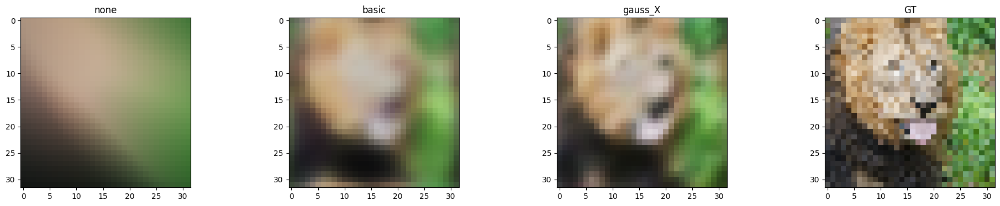

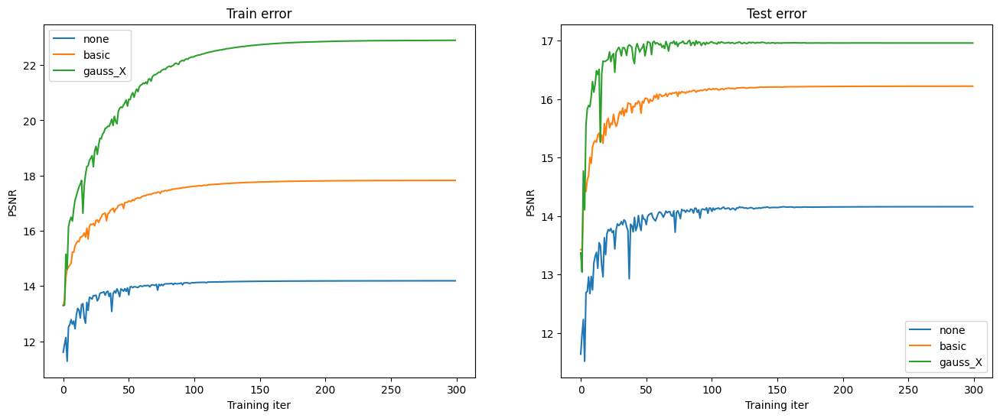

In [152]:
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# High Resolution Reconstruction

#### High Resolution Reconstruction - SGD - Various Input Mapping Stategies

Repeat the previous experiment, but at the higher resolution. The reason why we have you first experiment with the lower resolution since it is faster to train and debug. Additionally, you will see how the mapping strategies perform better or worse at the two different input resolutions. 

In [178]:
epochs = 400

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_56491/2979632171.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


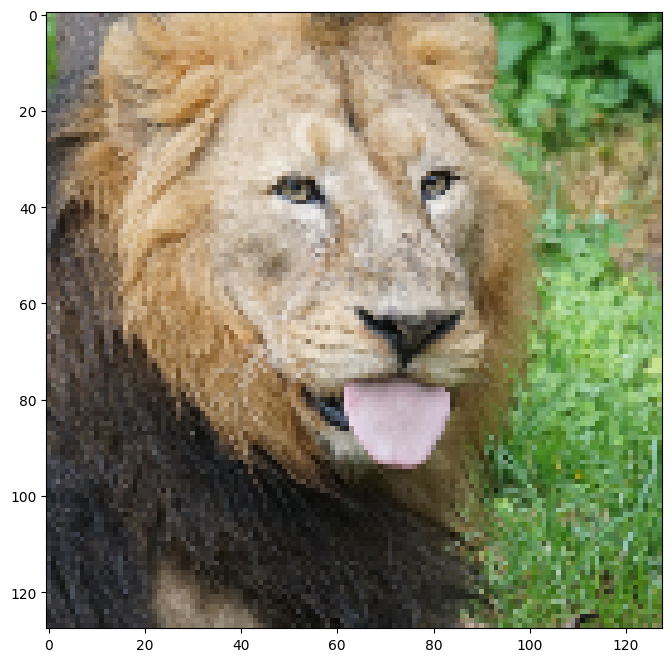

In [284]:
# load hi-res image
size = 128
train_data, test_data = get_image(size)

In [179]:
outputs = {}
B_dict = get_B_dict(256) # 128 : test psnr - 20.. train psnr 21..
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/400 [00:00<?, ?it/s]

training basic


  0%|          | 0/400 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/400 [00:00<?, ?it/s]

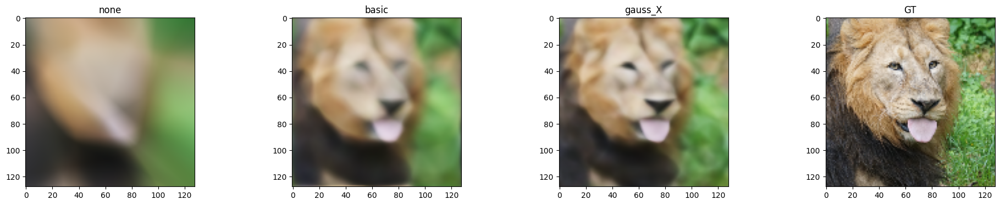

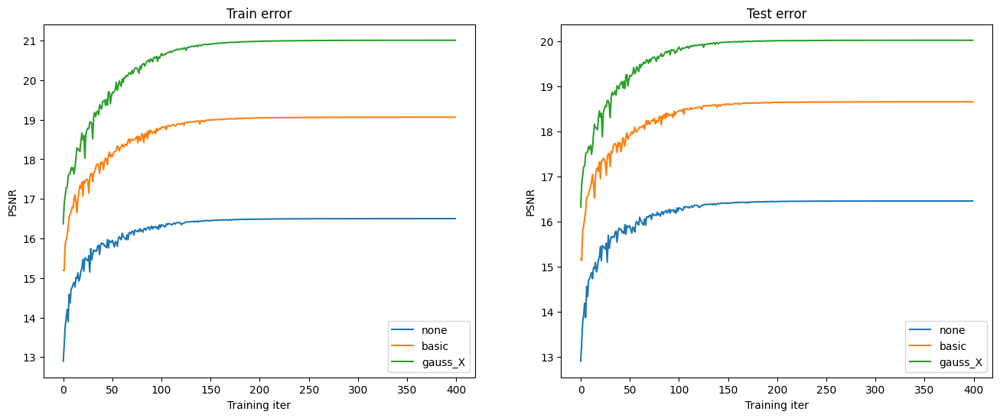

In [180]:
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test

# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# Extra credits :

##  performance of rendering quality wrt changing std of B

In [12]:
def get_B_dict_varying_std(size,sigma): 
  mapping_size = size // 2 # you may tweak this hyperparameter
  B_dict = {}
  B_dict['none'] = None
  
  # add B matrix for basic, gauss_1.0
  # TODO implement this
  B_dict['basic'] = np.eye(2)
  # B_dict['gauss_X'] = np.random.normal(0,1,size=(mapping_size,2))
  B_dict['gauss_X'] = np.random.normal(0,sigma,size=(mapping_size,2))
  return B_dict

  0%|          | 0/6 [00:00<?, ?it/s]

training 1


  0%|          | 0/200 [00:00<?, ?it/s]

training 2


  0%|          | 0/200 [00:00<?, ?it/s]

training 5


  0%|          | 0/200 [00:00<?, ?it/s]

training 10


  0%|          | 0/200 [00:00<?, ?it/s]

training 32


  0%|          | 0/200 [00:00<?, ?it/s]

training 64


  0%|          | 0/200 [00:00<?, ?it/s]

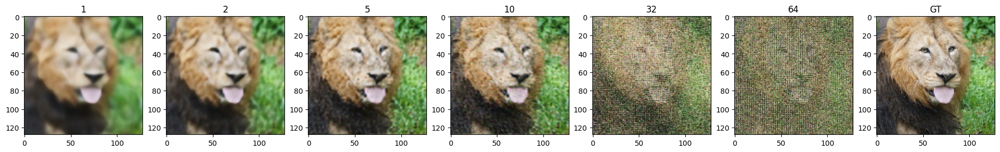

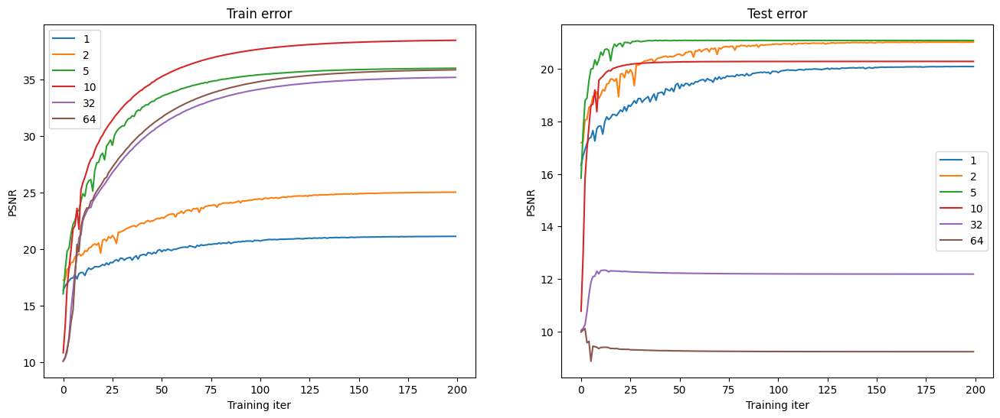

In [211]:
epochs = 200
learning_rate = 60
outputs_higher_var = {}
for k in tqdm([1,2,5,10,32,64]):
  B_dict = get_B_dict_varying_std(128,k) 
  print("training", k)
  outputs_higher_var[str(k)] = train_wrapper("gauss_X", B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs_higher_var, y_test.reshape(size,size,3))

## Varying dimension of B : 

  0%|          | 0/4 [00:00<?, ?it/s]

training 16


  0%|          | 0/200 [00:00<?, ?it/s]

training 64


  0%|          | 0/200 [00:00<?, ?it/s]

training 256


  0%|          | 0/200 [00:00<?, ?it/s]

training 512


  0%|          | 0/200 [00:00<?, ?it/s]

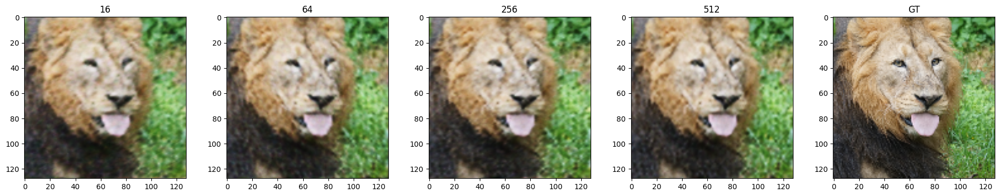

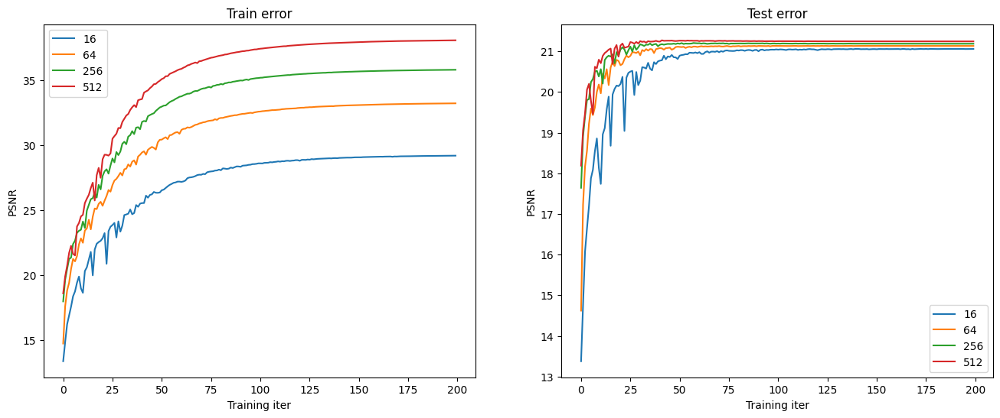

In [212]:
epochs = 200
learning_rate = 60
outputs_higher_var = {}
for m in tqdm([16,64,256,512]):
  B_dict = get_B_dict_varying_std(m,5) 
  print("training", m)
  outputs_higher_var[str(m)] = train_wrapper("gauss_X", B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs_higher_var, y_test.reshape(size,size,3))

## Varying Number of Hidden layers : 

  0%|          | 0/3 [00:00<?, ?it/s]

training 4


  0%|          | 0/200 [00:00<?, ?it/s]

training 10


  0%|          | 0/200 [00:00<?, ?it/s]

training 15


  0%|          | 0/200 [00:00<?, ?it/s]

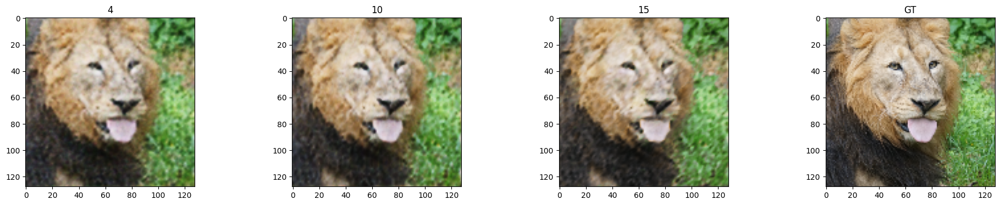

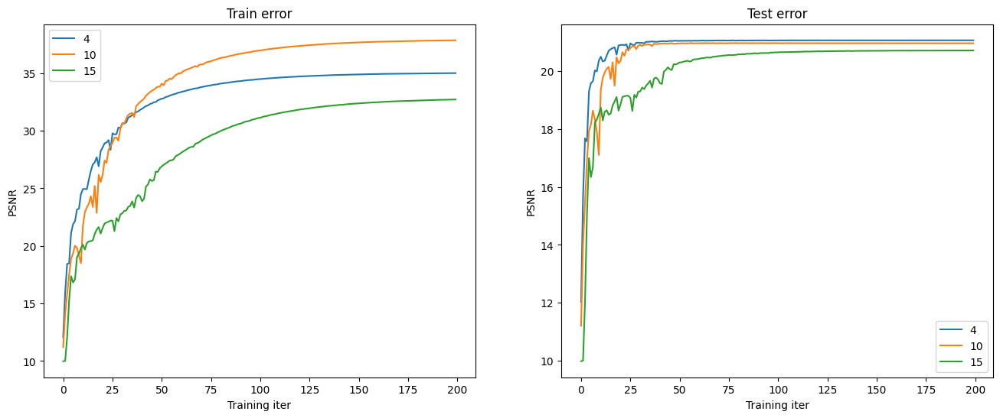

In [220]:
epochs = 200
learning_rate = 60
outputs_higher_var = {}
for h in tqdm([4,10,15]):
  B_dict = get_B_dict_varying_std(64,5) 
  print("training", h)
  outputs_higher_var[str(h)] = train_wrapper("gauss_X", B_dict, h, hidden_size, output_size, epochs, learning_rate, opt='SGD')

X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs_higher_var, y_test.reshape(size,size,3))

## Regularization !!

In [324]:
epochs = 150
learning_rate = 60
outputs_regs = {}
for r in tqdm([0.0,1e-7, 1e-6, 1e-5, 1e-4]):
  B_dict = get_B_dict_varying_std(64,5) 
  print("training", r)
  outputs_regs[str(r)] = train_wrapper("gauss_X", B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD',regularization=r)

  0%|          | 0/1 [00:00<?, ?it/s]

training 0.0


  0%|          | 0/150 [00:00<?, ?it/s]

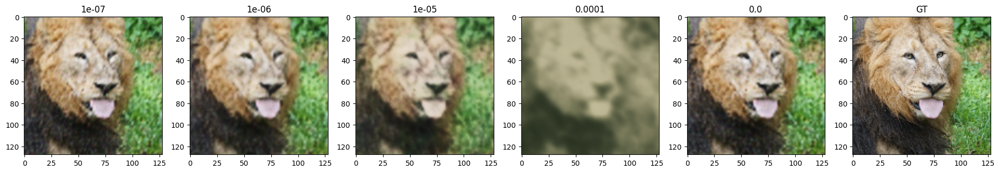

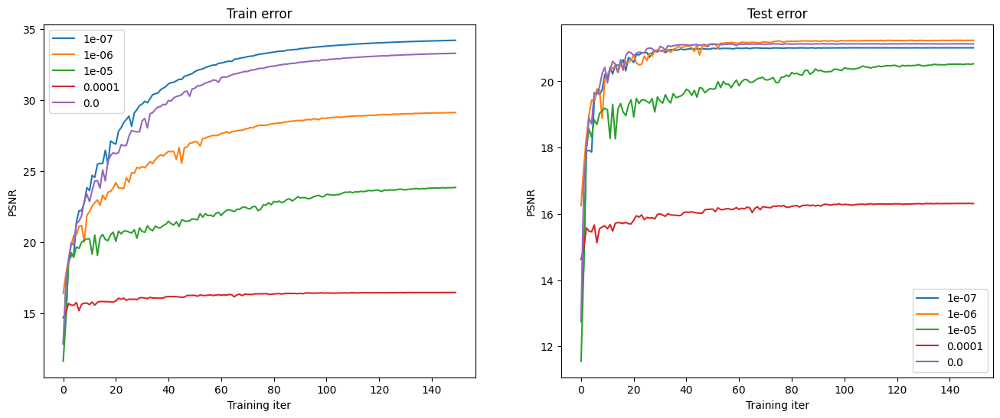

In [325]:
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test
plot_feature_mapping_comparison(outputs_regs, y_test.reshape(size,size,3))

# High Resolution Reconstruction - Image of your Choice

When choosing an image select one that you think will give you interesting results or a better insight into the performance of different feature mappings and explain why in your report template. 

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_56491/2979632171.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


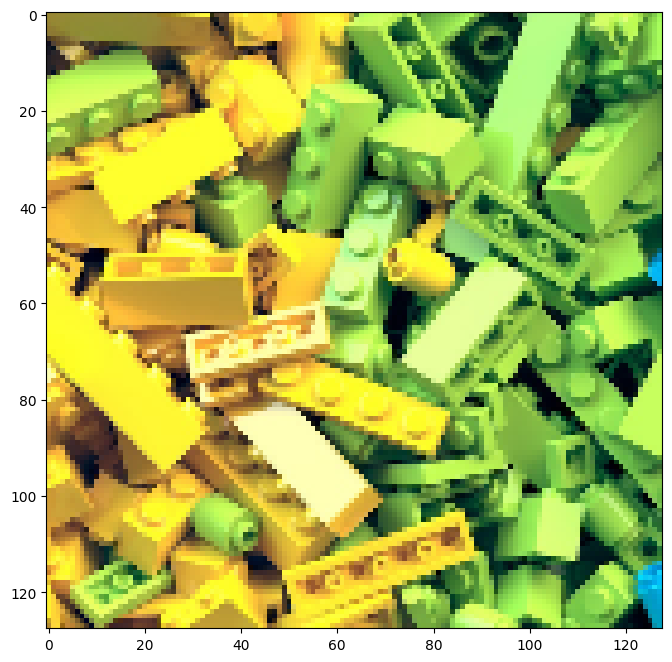

In [338]:
size = 128
# TODO pick an image and replace the url string
train_data, test_data = get_image(size, image_url="https://media.wired.com/photos/6504c76d3f0b6cf71150b744/master/w_2240,c_limit/How-to-Build-Your-Lego-Collection-Gear-GettyImages-900408694.jpg")

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/200 [00:00<?, ?it/s]

training basic


  0%|          | 0/200 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/200 [00:00<?, ?it/s]

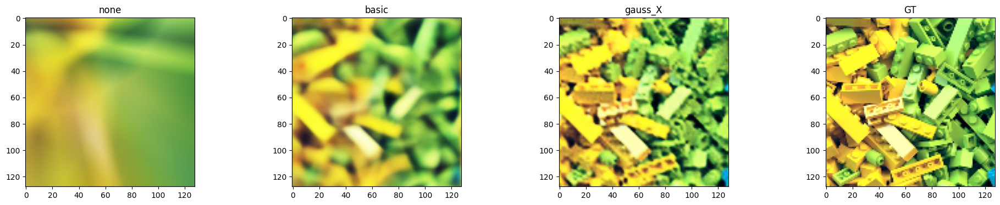

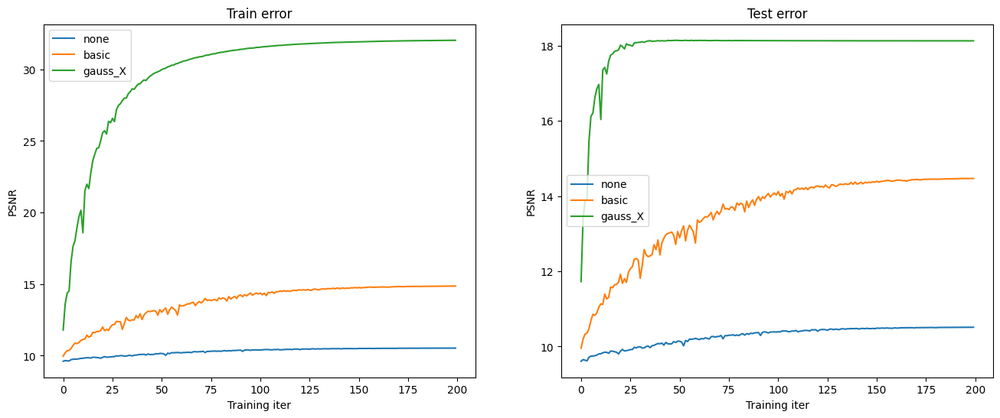

In [339]:
epochs = 200
learning_rate = 60
outputs_higher_var = {}
B_dict = get_B_dict_varying_std(128,5) 
for k in tqdm(B_dict):
  print("training", k)
  outputs_higher_var[str(k)] = train_wrapper(k, B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs_higher_var, y_test.reshape(size,size,3))

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_56491/971795617.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


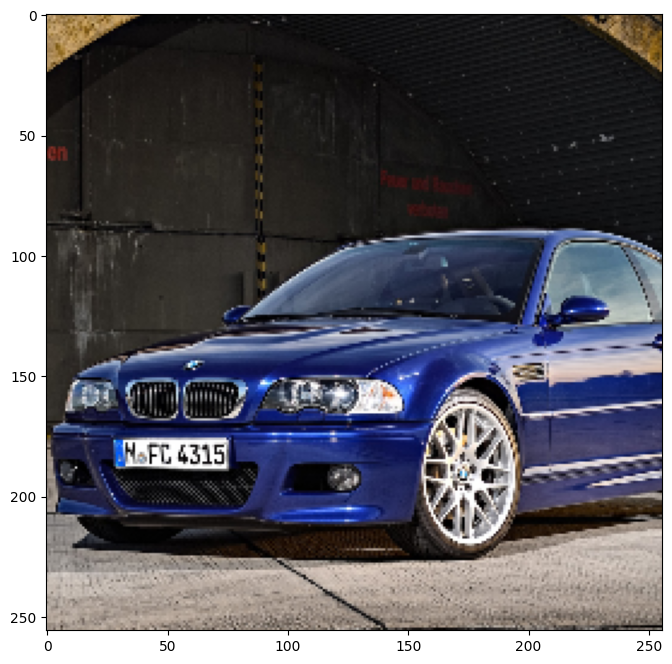

In [353]:
size = 256
# TODO pick an image and replace the url string
train_data, test_data = get_image(size, image_url="https://www.bmw-m.com/content/dam/bmw/marketBMW_M/www_bmw-m_com/topics/magazine-article-pool/2018/bmw-m3-e46/bmw-m3-e46-portraet-01-st-16x9.jpg")

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/200 [00:00<?, ?it/s]

training basic


  0%|          | 0/200 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/200 [00:00<?, ?it/s]

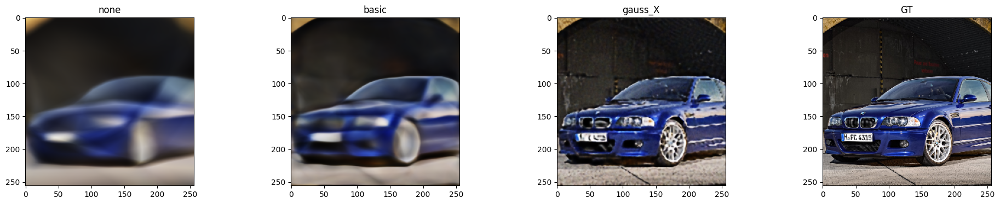

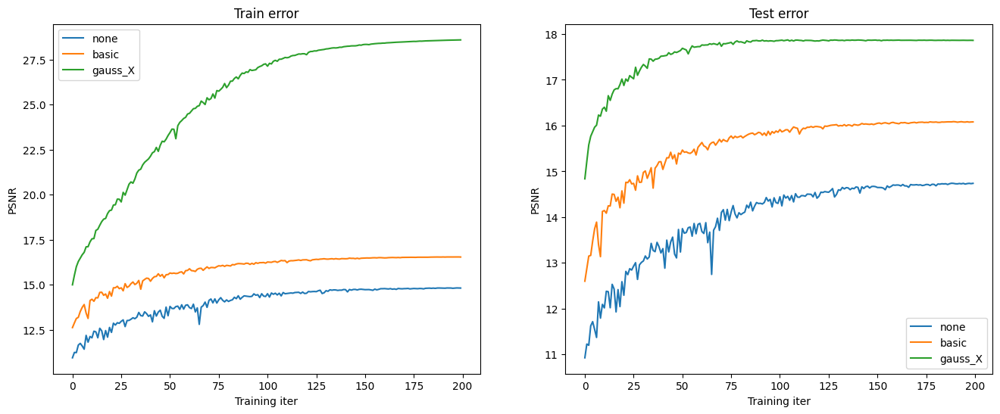

In [354]:
epochs = 200
learning_rate = 60
outputs_higher_var = {}
B_dict = get_B_dict_varying_std(128,5) 
for k in tqdm(B_dict):
  print("training", k)
  outputs_higher_var[str(k)] = train_wrapper(k, B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='SGD')

X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test
# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs_higher_var, y_test.reshape(size,size,3))

# Reconstruction Process Video (Optional)
(For Fun!) Visualize the progress of training in a video 

In [181]:
# requires installing this additional dependency
!pip install imageio-ffmpeg

In [189]:
np.shape(outputs)

(300, 1024, 3)

In [182]:
# single video example
create_and_visualize_video({"gauss": {"pred_imgs": predicted_images}}, filename="training_high_res_gauss.mp4")

ValueError: cannot reshape array of size 921600 into shape (1000,32,32,3)

In [190]:
# multi video example
create_and_visualize_video(outputs, epochs=epochs, size=128)

,,
none,basic,gauss_X


# Extra Credit - Adam Optimizer

#### Low Resolution Reconstruction - Adam - None Mapping

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_56491/2979632171.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


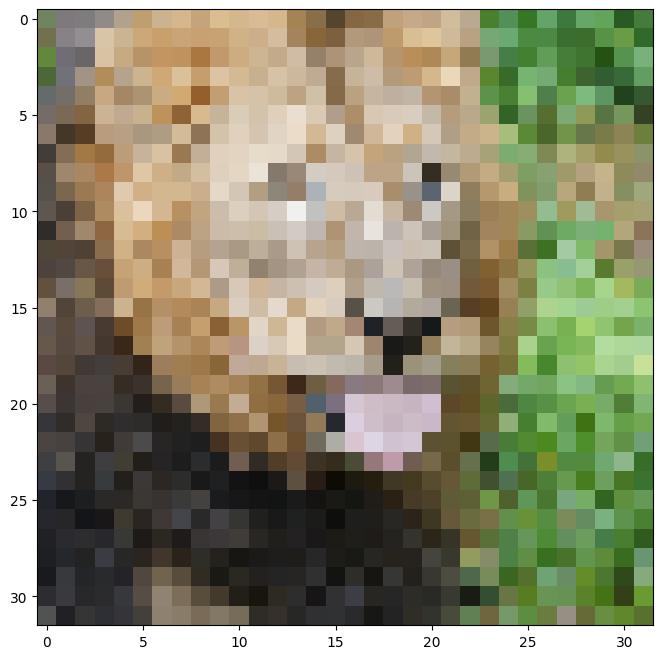

In [222]:
# load low-res image
size = 32
train_data, test_data = get_image(size)

  0%|          | 0/200 [00:00<?, ?it/s]

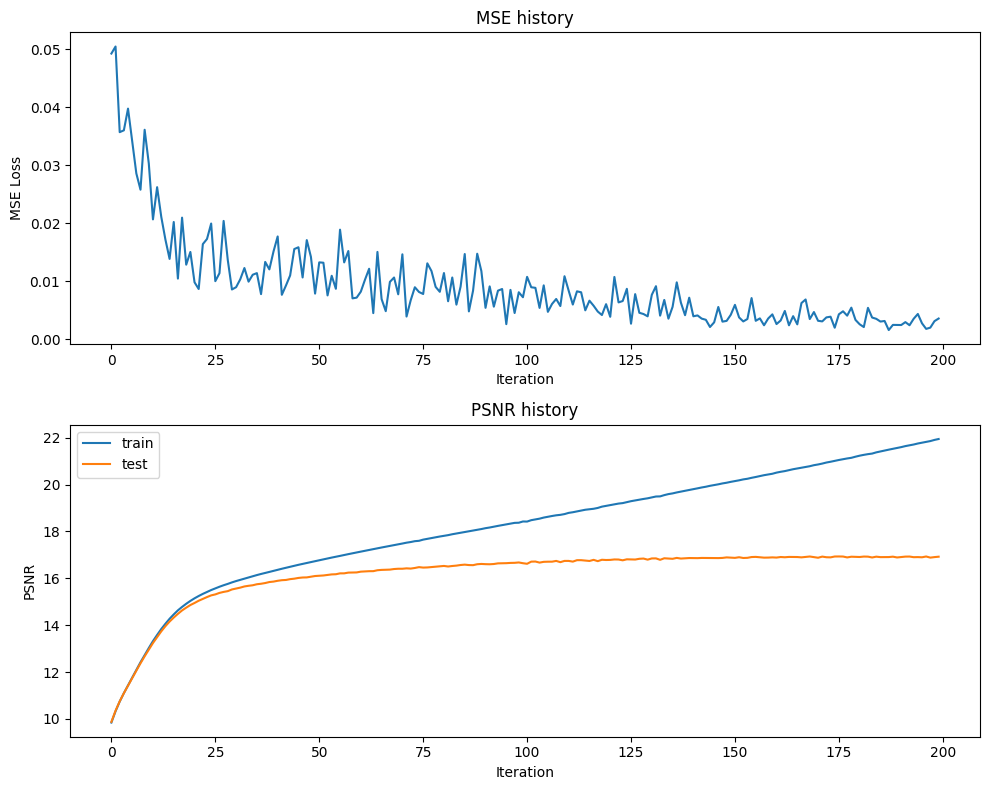

Final Test MSE 0.010159750426683207
Final Test psnr 16.920869646603208


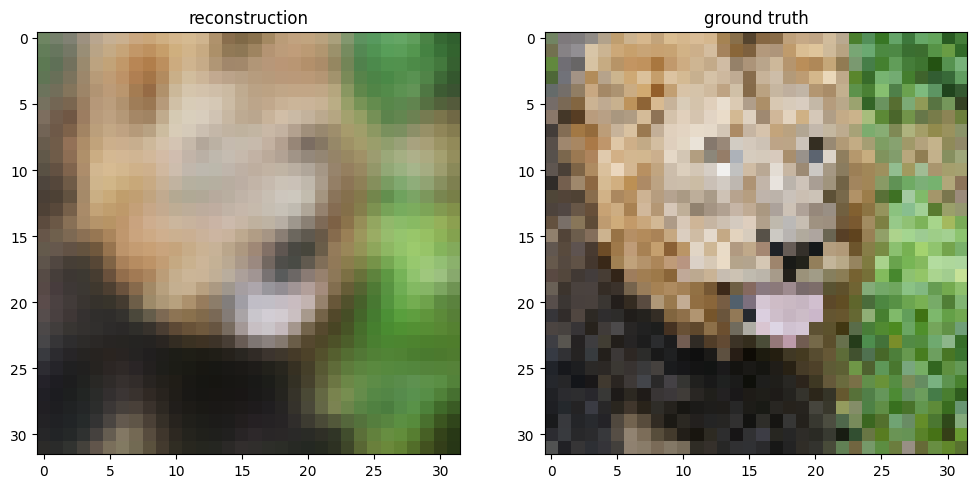

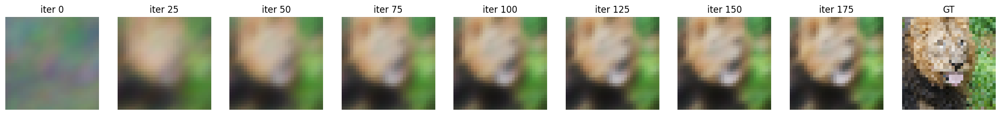

In [265]:
B_dict = get_B_dict_varying_std(64,1) 
epochs = 200
learning_rate = 0.00005

# get input features
# TODO implement this by using the get_B_dict() and get_input_features() helper functions
X_train, y_train, X_test, y_test = get_input_features(B_dict,"gauss_X")

# run NN experiment on input features
# TODO implement by using the NN_experiment() helper function
net, train_psnr, test_psnr, train_loss, predicted_images = NN_experiment(X_train, y_train, X_test, y_test, X_train.shape[1], num_layers, hidden_size, output_size, epochs, learning_rate,opt='Adam')

# plot results of experiment
plot_training_curves(train_loss, train_psnr, test_psnr)
plot_reconstruction(net.forward(X_test), y_test)
plot_reconstruction_progress(predicted_images, y_test)

#### Low Resolution Reconstruction - Adam - Various Input Mapping Stategies

In [272]:
# start training
epochs = 500
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='Adam')

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/500 [00:00<?, ?it/s]

training basic


  0%|          | 0/500 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/500 [00:00<?, ?it/s]

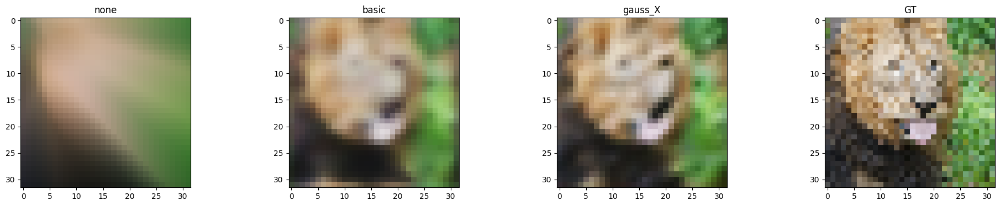

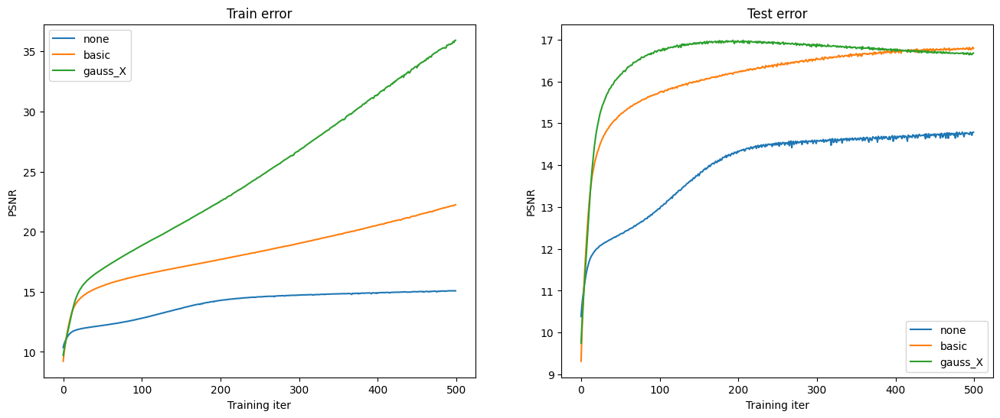

In [273]:
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

#### High Resolution Reconstruction - Adam - Various Input Mapping Stategies

Repeat the previous experiment, but at the higher resolution. The reason why we have you first experiment with the lower resolution since it is faster to train and debug. Additionally, you will see how the mapping strategies perform better or worse at the two different input resolutions. 

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_56491/2979632171.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


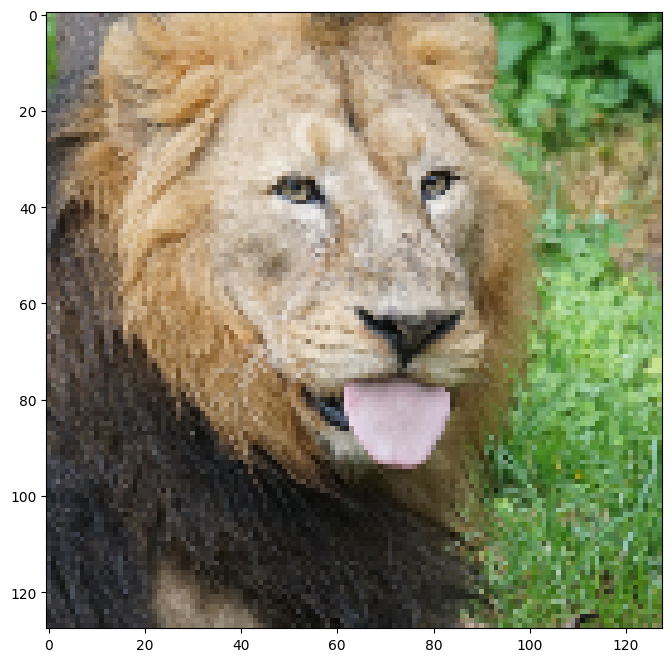

  0%|          | 0/3 [00:00<?, ?it/s]

training none


  0%|          | 0/200 [00:00<?, ?it/s]

training basic


  0%|          | 0/200 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/200 [00:00<?, ?it/s]

In [274]:
# load image
size = 128
train_data, test_data = get_image(size)
epochs = 200
learning_rate = 0.00005
B_dict = get_B_dict_varying_std(128,5)

# start training
outputs = {}
for k in tqdm(B_dict):
  print("training", k)
  outputs[k] = train_wrapper(k, B_dict, num_layers, hidden_size, output_size, epochs, learning_rate, opt='Adam')

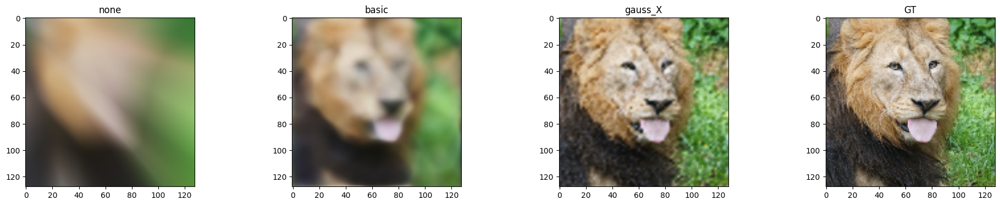

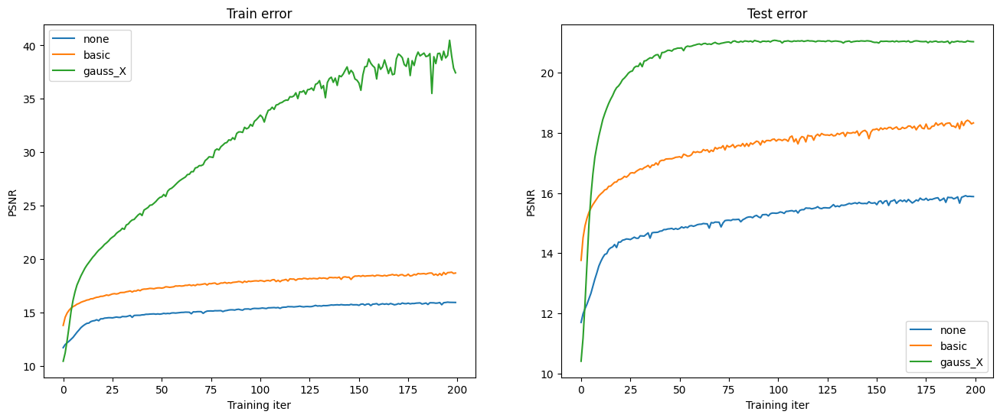

In [275]:
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(size), "none")  # for getting y_test

# if you did everything correctly so far, this should output a nice figure you can use in your report
plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))

# Pytorch

In [13]:
import torch 
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")

In [14]:
class RGB(nn.Module):
    def __init__(self, input_dim):
        super(RGB, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.fc2 = nn.Linear(256, 256)
        self.fc3 = nn.Linear(256, 256)
        self.fc_out = nn.Linear(256, 3)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = torch.sigmoid(self.fc_out(x))  # Output in [0,1] for RGB
        return x

/var/folders/82/fxrwhjg56lb36r831tlj6vdr0000gn/T/ipykernel_9404/2979632171.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(image_url)[..., :3] / 255.


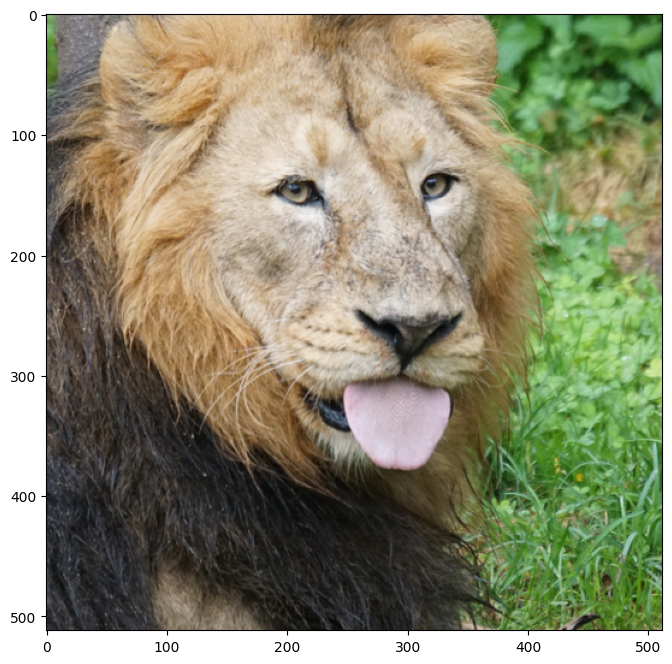

In [22]:
size = 512
train_data, test_data = get_image(size)

In [23]:
B_dict = get_B_dict_varying_std(128,5) 
epochs = 200
learning_rate = 0.00005
output_size = 3

In [17]:
def exp_runner(mapping, B_dict, epochs, learning_rate):
    X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)
    model = RGB(input_dim=X_train.shape[1])
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  
    
    train_loss = np.zeros(epochs)
    train_psnr = np.zeros(epochs)
    test_psnr = np.zeros(epochs)
    predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))
    N = len(X_train)
    batch_size = 32

    # Convert data to PyTorch tensors
    X_train = torch.tensor(X_train, dtype=torch.float32)
    y_train = torch.tensor(y_train, dtype=torch.float32)
    X_test = torch.tensor(X_test, dtype=torch.float32)
    y_test = torch.tensor(y_test, dtype=torch.float32)

    # For each epoch...
    for epoch in tqdm(range(epochs)):
        shuffled_i = torch.randperm(N)
        X_train = X_train[shuffled_i]
        y_train = y_train[shuffled_i]
        
        epoch_loss = 0  
        
        for i in range(0, N, batch_size):
            di = min(batch_size, N - i)
            X = X_train[i:i+di]
            y = y_train[i:i+di]

            p = model(X)
            loss = F.mse_loss(p, y)

            optimizer.zero_grad() 
            loss.backward()  
            optimizer.step()  

            epoch_loss += loss.item()*di  
        
        train_loss[epoch] = epoch_loss/N  
        predicted_images[epoch] = model(X_test).detach().numpy()
        train_psnr[epoch] = psnr(y_train.numpy(), model(X_train).detach().numpy())
        test_psnr[epoch] = psnr(y_test.numpy(), predicted_images[epoch])
        
        
    return {
        'net': model, 
        'train_psnrs': train_psnr, 
        'test_psnrs': test_psnr,
        'train_loss': train_loss,
        'pred_imgs': predicted_images
    }

In [25]:
def exp_runner(mapping, B_dict, epochs, learning_rate):
    device = torch.device("mps")  # Use Apple Metal Performance Shaders (MPS)

    # Load data
    X_train, y_train, X_test, y_test = get_input_features(B_dict, mapping)
    model = RGB(input_dim=X_train.shape[1]).to(device)  # Move model to MPS
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  
    
    train_loss = np.zeros(epochs)
    train_psnr = np.zeros(epochs)
    test_psnr = np.zeros(epochs)
    predicted_images = np.zeros((epochs, y_test.shape[0], y_test.shape[1]))
    N = len(X_train)
    batch_size = 32

    # Convert data to PyTorch tensors and move to MPS
    X_train = torch.tensor(X_train, dtype=torch.float32, device=device)
    y_train = torch.tensor(y_train, dtype=torch.float32, device=device)
    X_test = torch.tensor(X_test, dtype=torch.float32, device=device)
    y_test = torch.tensor(y_test, dtype=torch.float32, device=device)

    # Training loop
    for epoch in tqdm(range(epochs)):
        shuffled_i = torch.randperm(N, device=device)  # Ensure the permutation is on MPS
        X_train = X_train[shuffled_i]
        y_train = y_train[shuffled_i]
        
        epoch_loss = 0  
        
        for i in range(0, N, batch_size):
            di = min(batch_size, N - i)
            X = X_train[i:i+di]
            y = y_train[i:i+di]

            p = model(X)
            loss = F.mse_loss(p, y)

            optimizer.zero_grad() 
            loss.backward()  
            optimizer.step()  

            epoch_loss += loss.item() * di  
        
        train_loss[epoch] = epoch_loss / N  

        # Compute predictions on test data and move results to CPU
        with torch.no_grad():
            pred_test = model(X_test).cpu().numpy()
            pred_train = model(X_train).cpu().numpy()

        predicted_images[epoch] = pred_test
        train_psnr[epoch] = psnr(y_train.cpu().numpy(), pred_train)
        test_psnr[epoch] = psnr(y_test.cpu().numpy(), pred_test)
        
    return {
        'net': model, 
        'train_psnrs': train_psnr, 
        'test_psnrs': test_psnr,
        'train_loss': train_loss,
        'pred_imgs': predicted_images
    }

In [26]:
outputs = {}
for k in tqdm({"gauss_X" : B_dict["gauss_X"]}):
  print("training", k)
  outputs[k] = exp_runner(k, B_dict, epochs, learning_rate)

  0%|          | 0/1 [00:00<?, ?it/s]

training gauss_X


  0%|          | 0/200 [00:00<?, ?it/s]

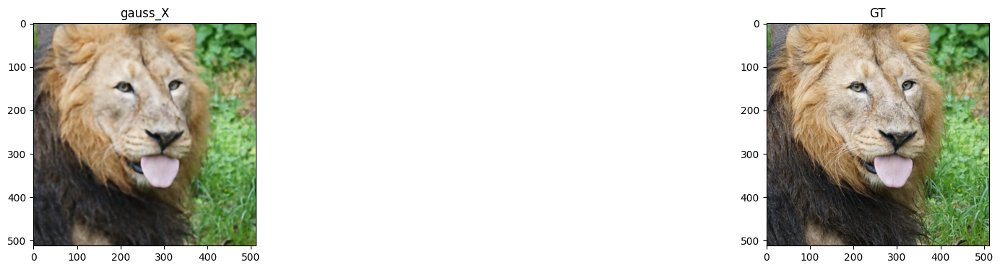

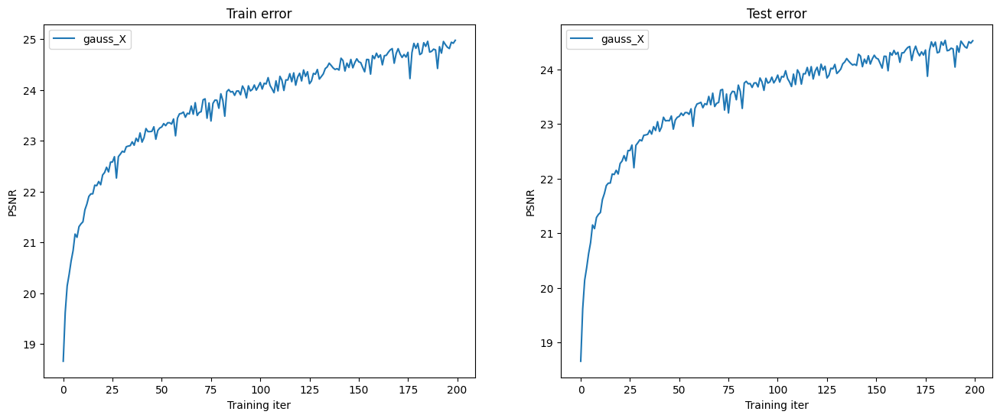

In [27]:
X_train, y_train, X_test, y_test = get_input_features(get_B_dict(32), "none")  # for getting y_test

plot_feature_mapping_comparison(outputs, y_test.reshape(size,size,3))